### Load libraries

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.basemap import Basemap, shiftgrid, interp, addcyclic
import scipy.io
from scipy.interpolate import griddata
import datetime
#from pylab import *
import numpy.ma as ma
from glob import glob
#from matplotlib.mlab import griddata
#from pylab import *

#import osgeo
#import gdal

from numpy import nan


import string
from scipy import stats
import matplotlib as mpl
import scipy.ndimage as ndimage
from netCDF4 import Dataset
from scipy import signal

import datetime as dt



In [7]:
# import cdsapi

# c = cdsapi.Client()

# c.retrieve(
#     'reanalysis-era5-single-levels-monthly-means',
#     {
#         'format': 'netcdf',
#         'variable': 'total_precipitation',
#         'product_type': 'monthly_averaged_reanalysis',
#         'year': [
#             '1979', '1980', '1981',
#             '1982', '1983', '1984',
#             '1985', '1986', '1987',
#             '1988', '1989', '1990',
#             '1991', '1992', '1993',
#             '1994', '1995', '1996',
#             '1997', '1998', '1999',
#             '2000', '2001', '2002',
#             '2003', '2004', '2005',
#             '2006', '2007', '2008',
#             '2009', '2010', '2011',
#             '2012', '2013', '2014',
#             '2015', '2016', '2017',
#             '2018', '2019',
#         ],
#         'month': [
#             '01', '02', '03',
#             '04', '05', '06',
#             '07', '08', '09',
#             '10', '11', '12',
#         ],
#         'time': '00:00',
#         'grid':'2.5/2',        
#     },
#     '/Users/mct/Dropbox/WilliamGregory/total_precipitation.nc')

2020-02-04 18:50:07,120 INFO Welcome to the CDS
2020-02-04 18:50:07,162 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-single-levels-monthly-means
2020-02-04 18:50:07,396 INFO Request is queued
2020-02-04 18:50:08,413 INFO Request is running
2020-02-04 18:56:25,670 INFO Request is completed
2020-02-04 18:56:25,672 INFO Downloading http://136.156.133.42/cache-compute-0014/cache/data2/adaptor.mars.internal-1580841313.8524718-19979-19-fb28b7a6-28dc-43ec-a977-a412576d56d3.nc to /Users/mct/Dropbox/WilliamGregory/total_precipitation.nc (24.6M)
2020-02-04 18:56:30,802 INFO Download rate 4.8M/s     


Result(content_length=25792884,content_type=application/x-netcdf,location=http://136.156.133.42/cache-compute-0014/cache/data2/adaptor.mars.internal-1580841313.8524718-19979-19-fb28b7a6-28dc-43ec-a977-a412576d56d3.nc)

In [2]:
##############################################################################################
# Function to calculate the spatial mean of one field and write the trends in .dat files
# returns
#          ---> trend_time[year]
#          ---> trend_space[x,y]
##############################################################################################

def cal_trend(start_year, num_years, start_month, num_months, nx, ny, var):

# Initialize
        x = nx
        y = ny

##################
# Maps of trends
##################

# Monthly averaged
        num_years
        years = np.arange(num_years)
        trend_ym = np.zeros((num_months, x, y))
        sig_a_ym = np.zeros((num_months, x, y))
        r_a_ym = np.zeros((num_months, x, y))
        int_a_ym = np.zeros((num_months, x, y))

        for month in range(num_months):
                print (month)
                var_y = np.mean(var,1)
                for i in range(x):
                        for j in range(y):
                                slope, intercept, r, prob, stderr = stats.linregress(years,var[start_year:start_year+num_years, month, i, j])
                                trend_ym[month, i, j] = slope
                                sig_a_ym[month, i, j] = 100*(1-prob)
                                r_a_ym[month, i, j] = r
                                int_a_ym[month, i, j] = intercept

# Yearly averaged
        years = np.arange(num_years)
        trend = np.zeros((x, y))
        sig_a = np.zeros((x, y))
        r_a = np.zeros((x, y))
        int_a = np.zeros((x, y))

        for i in range(x):
                for j in range(y):
                        slope, intercept, r, prob, stderr = stats.linregress(years,var_y[start_year:start_year+num_years, i, j])
                        trend[i, j] = slope
                        sig_a[i, j] = 100*(1-prob)
                        r_a[i, j] = r
                        int_a[i, j] = intercept

        return trend, trend_ym, sig_a, sig_a_ym, r_a, r_a_ym, int_a, int_a_ym



In [3]:
#Bug fix for addcyclic
#https://github.com/matplotlib/basemap/blob/master/lib/mpl_toolkits/basemap/__init__.py#L5102
def addcyclic(*arr,**kwargs):
    """
    Adds cyclic (wraparound) points in longitude to one or several arrays,
    the last array being longitudes in degrees. e.g.
   ``data1out, data2out, lonsout = addcyclic(data1,data2,lons)``
    ==============   ====================================================
    Keywords         Description
    ==============   ====================================================
    axis             the dimension representing longitude (default -1,
                     or right-most)
    cyclic           width of periodic domain (default 360)
    ==============   ====================================================
    """
    # get (default) keyword arguments
    axis = kwargs.get('axis',-1)
    cyclic = kwargs.get('cyclic',360)
    # define functions
    def _addcyclic(a):
        """addcyclic function for a single data array"""
        npsel = np.ma if np.ma.is_masked(a) else np
        slicer = [slice(None)] * np.ndim(a)
        try:
            slicer[axis] = slice(0, 1)
        except IndexError:
            raise ValueError('The specified axis does not correspond to an '
                    'array dimension.')
        return npsel.concatenate((a,a[slicer]),axis=axis)
    def _addcyclic_lon(a):
        """addcyclic function for a single longitude array"""
        # select the right numpy functions
        npsel = np.ma if np.ma.is_masked(a) else np
        # get cyclic longitudes
        clon = (np.take(a,[0],axis=axis)
                + cyclic * np.sign(np.diff(np.take(a,[0,-1],axis=axis),axis=axis)))
        # ensure the values do not exceed cyclic
        clonmod = npsel.where(clon<=cyclic,clon,np.mod(clon,cyclic))
        return npsel.concatenate((a,clonmod),axis=axis)
    # process array(s)
    if len(arr) == 1:
        return _addcyclic_lon(arr[-1])
    else:
        return list(map(_addcyclic,arr[:-1])) + [_addcyclic_lon(arr[-1])]

In [4]:
def get_TP_data():
    TP = {}
    months = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
    file = Dataset('../ERA5_Data/total_precipitation.nc')
    data = np.array(file['tp_0001'])
#    data = np.array(file['p0001'])
    data = data.transpose(1,2,0)
    TP['all_months'] = data
    for month in range(12):
        monthly = np.zeros((dimX,dimY,(2019-1979+1)))
        t = 0
        for y in range(0,(2019-1979+1)*12,12):
            monthly[:,:,t] = data[:,:,y+month]
            t += 1
        TP[months[month]] = monthly
    return TP

lon = np.arange(0,360,2.5)
lat = np.arange(90,-92,-2)
dimX = len(lat)
dimY = len(lon)
lon,lat = np.meshgrid(lon,lat)

TP = get_TP_data()

In [5]:
lon.shape

(91, 144)

In [6]:
TP['jan'].shape

TP['JFM']=(TP['jan']+TP['feb']+TP['mar'])/3.
TP['AMJ']=(TP['apr']+TP['may']+TP['jun'])/3.
TP['JAS']=(TP['jul']+TP['aug']+TP['sep'])/3.
TP['OND']=(TP['oct']+TP['nov']+TP['dec'])/3.

In [7]:
TP['all_months'].shape

(91, 144, 492)

In [9]:
#TP=[]
TP_season=[]
for i in range(4):
    TP_season.append((TP['all_months'][:,:,0+i*3:492:12]+TP['all_months'][:,:,1+i*3:492:12]+TP['all_months'][:,:,2+i*3:492:12])/3.)

In [10]:
TP_season[0].shape

(91, 144, 41)

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

/Users/micheltsamados/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


<Figure size 432x288 with 0 Axes>

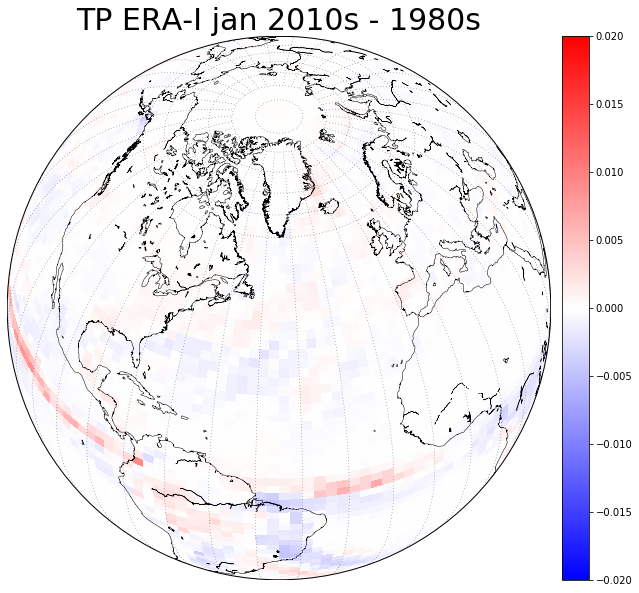

In [14]:
#Plot maps monthly
#https://werthmuller.org/blog/2014/basemap/
from matplotlib import cm, rcParams
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
months=['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
#months=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for month in range(1):
    month_str = '%02d' % (month+1)
    plt.clf()
    plt.figure(figsize=(15,10))
    m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')

    #m = Basemap(width=3000000,height=2000000,
    #        rsphere=(6378137.00,6356752.3142),\
    #        resolution='l',area_thresh=1000.,projection='lcc',\
    #        lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
    #t=12*(20-1)+7
    m.drawcoastlines(linewidth = 0.5)
    m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
    m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
    ax = plt.gca()
    llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
    diff=np.mean(TP[months[month]][:,:,31:40],2)-np.mean(TP[months[month]][:,:,1:10],2)
    #lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
    diff_out,lat_out,lon_out=addcyclic(diff[:,:],lat[:,:],lon[:,:])
    x, y = m(lon_out, lat_out)
    my_cmap=plt.cm.bwr
    #my_cmap_r = reverse_colourmap(my_cmap)
    #CS=m.pcolor(x, y, diff, vmin=-0.5, vmax=+0.5,cmap=my_cmap)
    #CS=m.contourf(x, y, diff_out,levels=[-0.02, -0.15, -0.1, -0.05, 0., 0.05,0.1,0.15,0.2], extend='both', vmin=-2, vmax=+2,cmap=my_cmap)
    CS=m.pcolor(x, y, diff_out, vmin=-0.02, vmax=+0.02,cmap=my_cmap)



    m.colorbar()
    plt.title('TP ERA5 '+ months[month]+' '+'2010s - 1980s', fontsize=30)
    #plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2010s-1990s.png', dpi=100)
    #plt.title('TP ERA-I '+ months[month]+' '+'2010s - 2000s', fontsize=30)
    #plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2010s-2000s_Turkey.png', dpi=100)
    plt.show()

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

/Users/micheltsamados/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


<Figure size 432x288 with 0 Axes>

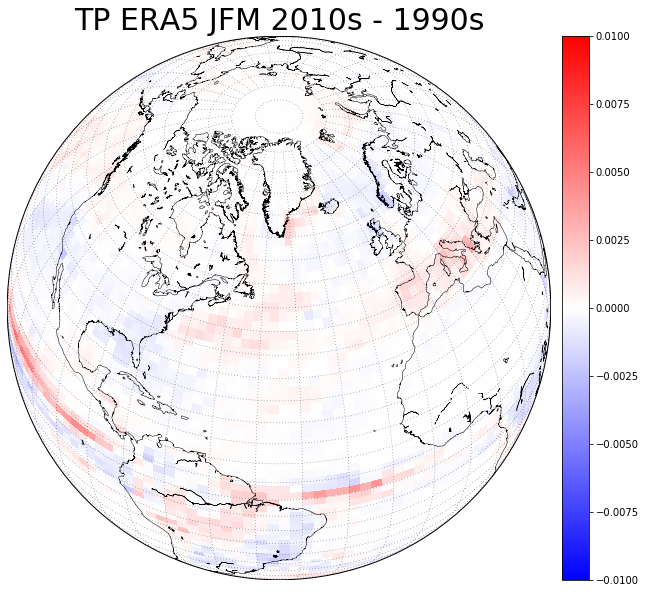

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

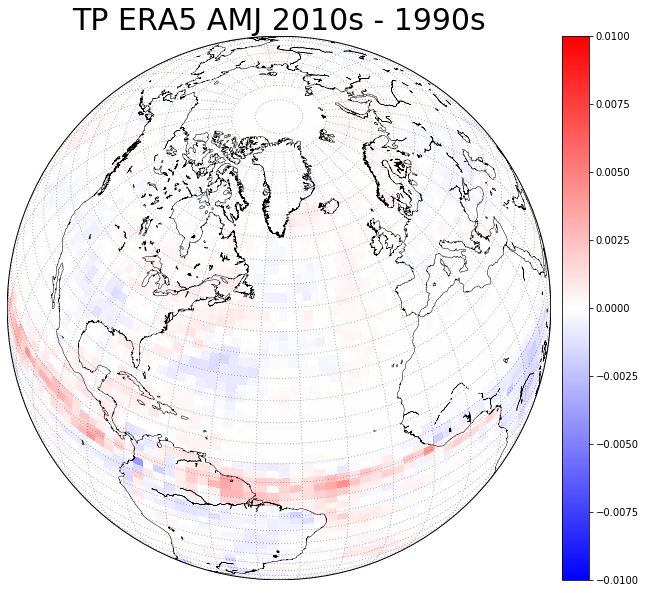

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

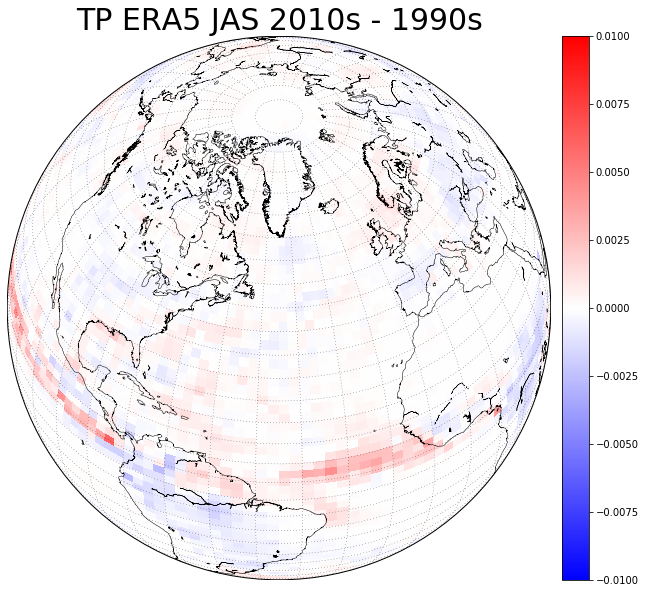

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

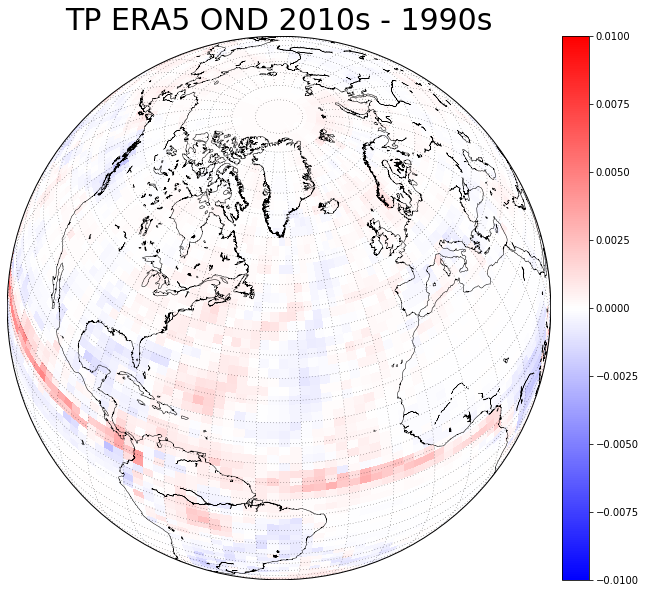

In [16]:
#Plot maps season
#https://werthmuller.org/blog/2014/basemap/
from matplotlib import cm, rcParams
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
seasons=['JFM','AMJ','JAS','OND']
for season in range(4):
    #season = '%02d' % (month+1)
    plt.clf()
    plt.figure(figsize=(15,10))
    m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
    #m = Basemap(width=4000000,height=3000000,
    #        rsphere=(6378137.00,6356752.3142),\
    #        resolution='l',area_thresh=1000.,projection='lcc',\
    #        lat_1=30.,lat_2=40,lat_0=40,lon_0=39.)
    #t=12*(20-1)+7
    m.drawcoastlines(linewidth = 0.5)
    m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
    m.drawparallels(np.arange(-90,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
    ax = plt.gca()
    llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
    #CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
    #diff=np.mean(TP_season[season][10:20:1],0)-np.mean(TP_season[season][0:10:1],0) #2000s-1990s
    #diff=np.mean(TP_season[season][20:28:1],0)-np.mean(TP_season[season][10:20:1],0) #2000s-1990s
    diff=np.mean(TP_season[season][:,:,31:40:1],2)-np.mean(TP_season[season][:,:,11:21:1],2) #2010s-1990s
    #lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
    TP_out,lat_out,lon_out=addcyclic(diff[:,:],lat[:,:],lon[:,:])
#    TP_out,lat_out,lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
    x, y = m(lon_out, lat_out)
    my_cmap=plt.cm.bwr
    #my_cmap_r = reverse_colourmap(my_cmap)
    #CS=m.pcolormesh(x, y, TP_out, vmin=-2.5, vmax=+2.5,cmap=my_cmap)
    #CS=m.contourf(x, y, TP_out,levels=[-0.5, -0.25, 0, 0.25, 0.5, 0.75,1.,1.25,1.5], extend='both', vmin=-2, vmax=+2,cmap=my_cmap)
    CS=m.pcolor(x, y, TP_out, vmin=-0.01, vmax=+0.01,cmap=my_cmap)



    #CS=m.contourf(x, y, TP_out,levels=[-0.5, -0.25, 0, 0.25, 0.5, 0.75,1.,1.25,1.5], extend='both', vmin=-2, vmax=+2,cmap=my_cmap)
    m.colorbar()
#    plt.title('TP ERA-I '+ seasons[season]+' '+'2000s - 1990s', fontsize=30)
#    plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+seasons[season]+'_2000s-1990s.png', dpi=100)
#    plt.title('TP ERA-I '+ seasons[season]+' '+'2010s - 2000s', fontsize=30)
#    plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+seasons[season]+'_2010s-2000s.png', dpi=100)
    plt.title('TP ERA5 '+ seasons[season]+' '+'2010s - 1990s', fontsize=30)
    #plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+seasons[season]+'_2010s-1990s_Turkey.png', dpi=100)
    plt.show()





In [60]:
21*12

252

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

/Users/micheltsamados/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


<Figure size 432x288 with 0 Axes>

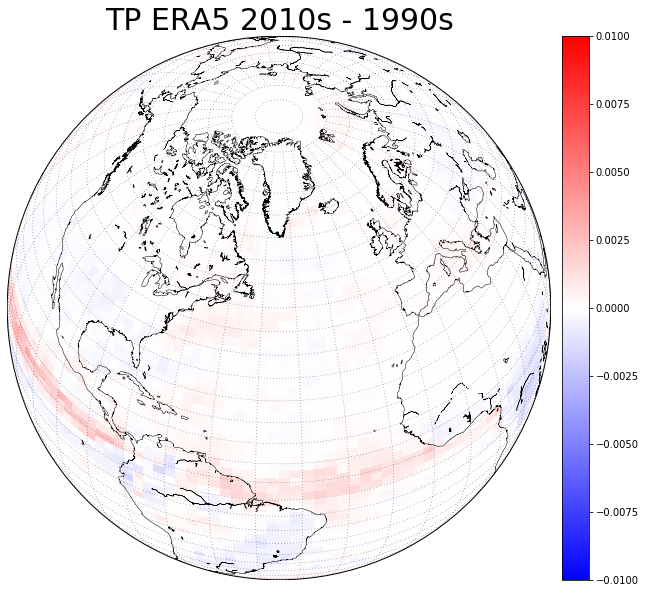

In [17]:
#Plot yearly average 
from matplotlib import cm, rcParams
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
months=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(-90,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
llevels = np.arange(-2000,0,250) # check etopo.ravel().max()

#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120:240:1],0)-np.mean(TP_array[0:120:1],0) #2000s - 1990s
#diff=np.mean(TP_array[240:336:1],0)-np.mean(TP_array[120:240:1],0) #2010s - 2000s
#diff=np.mean(TP_array[240:336:1],0)-np.mean(TP_array[0:120:1],0) #2010s - 2000s
diff=np.mean(TP['all_months'][:,:,372:480],2)-np.mean(TP['all_months'][:,:,132:252],2)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
TP_out,lat_out,lon_out=addcyclic(diff[:,:],lat[:,:],lon[:,:])
x, y = m(lon_out, lat_out)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolormesh(x, y, TP_out, vmin=-6, vmax=+6,cmap=my_cmap)
#CS=m.contourf(x, y, TP_out,levels=[-0.5, -0.25, 0, 0.25, 0.5, 0.75,1.,1.25,1.5], extend='both', vmin=-2, vmax=+2,cmap=my_cmap)
CS=m.pcolor(x, y, TP_out, vmin=-0.01, vmax=+0.01,cmap=my_cmap)

m.colorbar()
plt.rcParams.update({'font.size': 22})
#plt.title('TP ERA-I 2010s - 2000s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_yearly_2010s-2000s_contour_Turkey.png', dpi=100)
#plt.title('TP ERA-I 2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_yearly_2000s-1990s_contour.png', dpi=100)
plt.title('TP ERA5 2010s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_yearly_2010s-1990s_contour_Turkey.png', dpi=100)
plt.show()

In [19]:
# Trend 1979 - 2018
num_months = 12 
num_years = 40 
nx = 91
ny = 144
var_TP = np.zeros((num_years, num_months, nx, ny))
for k in range(480):
    year=np.int(k/12.)
    m=np.int(k-year*12)
    #print(k,m,y+1990)
    var_TP[year,m]=TP['all_months'][:,:,k]
    
    
start_year_TP = 1979
num_years_TP = 40
start_month = 0
start_year_trend = start_year_TP #1994#2004
num_years_trend = num_years_TP #10#7
start_year_trend = 1979 #1990
iyearstart = start_year_trend - start_year_TP
trend_TP, trend_m_TP, sig_a_TP, sig_a_m_TP, r_a_TP, r_a_m_TP, int_a_TP, int_a_m_TP = cal_trend(iyearstart, num_years_trend, start_month, num_months, nx, ny, var_TP)
#trend_m_CICE_masked=ma.masked_where(var0_CICE_3D[0]>1e10, trend_m_CICE)
#trend_m_CICE_masked=ma.masked_where(var0_CICE_3D_m_masked<0.15, trend_m_CICE)

0
1
2
3
4
5
6
7
8
9
10
11


([array([ 9., 10.,  8.,  4.,  9.,  6.,  7.,  9., 15., 14.]),
  array([ 4.,  6.,  9.,  7.,  9.,  7.,  7.,  9., 11., 22.]),
  array([ 8.,  7.,  7.,  7., 10.,  9.,  4.,  6., 10., 23.]),
  array([ 7.,  5.,  3.,  8.,  9.,  8.,  9.,  7., 13., 22.]),
  array([ 7.,  2.,  9.,  7.,  5.,  8.,  4., 11., 14., 24.]),
  array([ 7.,  6.,  9.,  3.,  1.,  9.,  6.,  7., 15., 28.]),
  array([ 8.,  4.,  8.,  4.,  8.,  4.,  9.,  8., 11., 27.]),
  array([10.,  3.,  7.,  3.,  3.,  8.,  9.,  8., 15., 25.]),
  array([ 9.,  1.,  7.,  8.,  6.,  5.,  8.,  9., 13., 25.]),
  array([ 5.,  3., 11.,  3.,  8.,  3.,  7.,  9.,  8., 34.]),
  array([ 4.,  5.,  6.,  5.,  7.,  2.,  7.,  9., 15., 31.]),
  array([ 5.,  0.,  7.,  6.,  4.,  5., 10.,  5., 14., 35.]),
  array([ 5.,  3., 11.,  5.,  4.,  6.,  5., 13., 14., 25.]),
  array([ 9.,  5.,  2.,  6.,  7.,  5.,  6., 11., 11., 29.]),
  array([ 9.,  1., 12.,  2.,  7.,  3.,  4., 13.,  7., 33.]),
  array([ 6.,  4.,  5.,  5.,  4.,  5.,  9.,  7., 11., 35.]),
  array([ 1.,  5.,  6., 

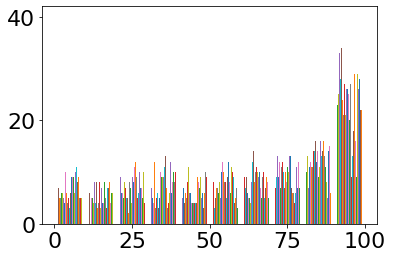

In [47]:
plt.hist(sig_a_TP)

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

/Users/micheltsamados/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


<Figure size 432x288 with 0 Axes>

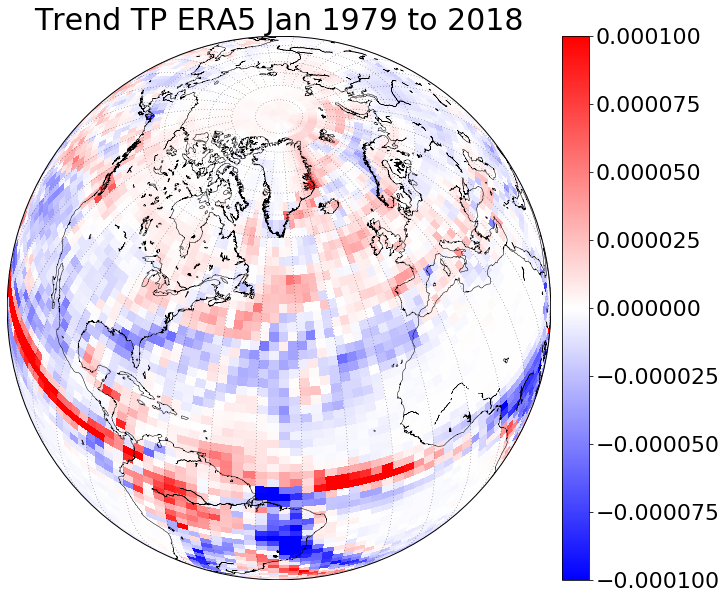

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

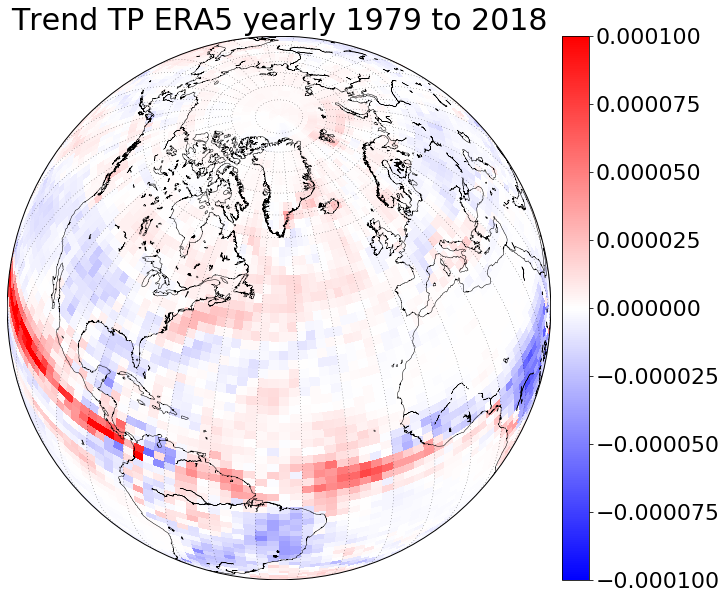

In [24]:
#Plot maps monthly
#https://werthmuller.org/blog/2014/basemap/
from matplotlib import cm, rcParams
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
months=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
for month in range(1):
    month_str = '%02d' % (month+1)
    plt.clf()
    plt.figure(figsize=(15,10))
    m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
    #m = Basemap(width=3000000,height=2000000,
    #        rsphere=(6378137.00,6356752.3142),\
    #        resolution='l',area_thresh=1000.,projection='lcc',\
    #        lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
    #t=12*(20-1)+7
    m.drawcoastlines(linewidth = 0.5)
    m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
    m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
    m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
    ax = plt.gca()
    #lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
    #TP_out,lat_out,lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
    TP_out,lat_out,lon_out=addcyclic(trend_m_TP[month,::-1,:],lat[::-1,:],lon[::-1,:])    
    x, y = m(lon_out, lat_out)
    
    
    llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
    #CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
    #diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
    #diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)

    my_cmap=plt.cm.bwr
    #my_cmap_r = reverse_colourmap(my_cmap)
    CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')
#    CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap='bwr_r')
    m.colorbar()
    #plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
    #plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
    plt.title('Trend TP ERA5 '+ months[month]+' '+ '1979 to 2018', fontsize=30)
    #plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_'+month_str+'_1990_to_2017_Turkey.png', dpi=100)
    plt.show()
    
    
#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
x, y = m(lon_out, lat_out)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')
#CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap='bwr_r')
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey.png', dpi=100)
plt.show()

In [44]:
z.shape

(120, 41)

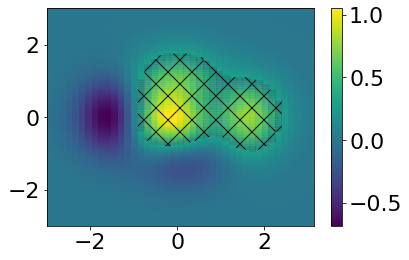

In [40]:
import matplotlib.pyplot as plt
import numpy as np

dx, dy = 0.15, 0.05
y, x = np.mgrid[slice(-3, 3 + dy, dy),
                slice(-3, 3 + dx, dx)]
z = (1 - x / 2. + x ** 5 + y ** 3) * np.exp(-x ** 2 - y ** 2)
z = z[:-1, :-1]
zm = np.ma.masked_less(z, 0.3)

cm = plt.pcolormesh(x, y, z)
plt.pcolor(x, y, zm, hatch='x', alpha=0.1)
plt.colorbar(cm)
plt.show()

/Users/micheltsamados/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


<Figure size 432x288 with 0 Axes>

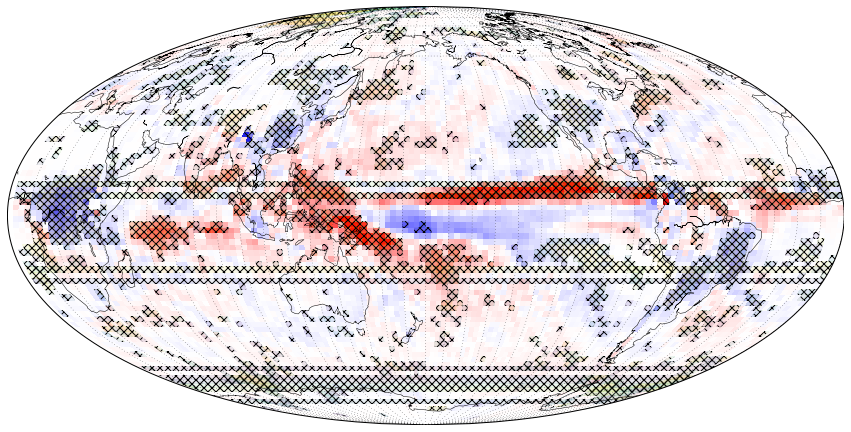

In [53]:

#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='moll',lon_0=-180,resolution='c')

#m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out_m = np.ma.masked_less(s2m_out, 95)

x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
#CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
CS=m.pcolor(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')
m.pcolor(x, y, s2m_out_m, hatch='xxx', alpha=0.1)

/Users/micheltsamados/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


<Figure size 432x288 with 0 Axes>

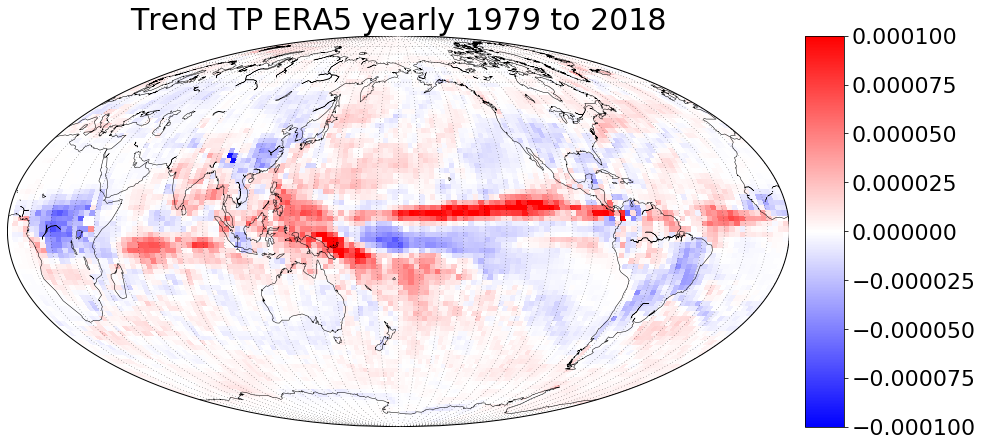

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

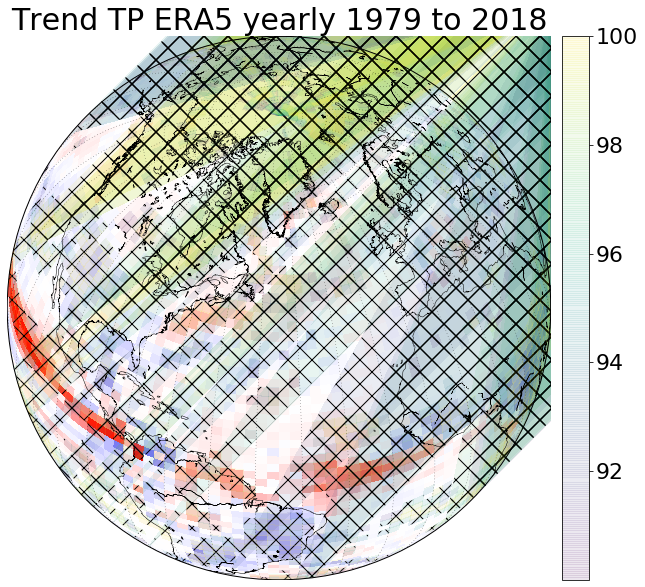

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

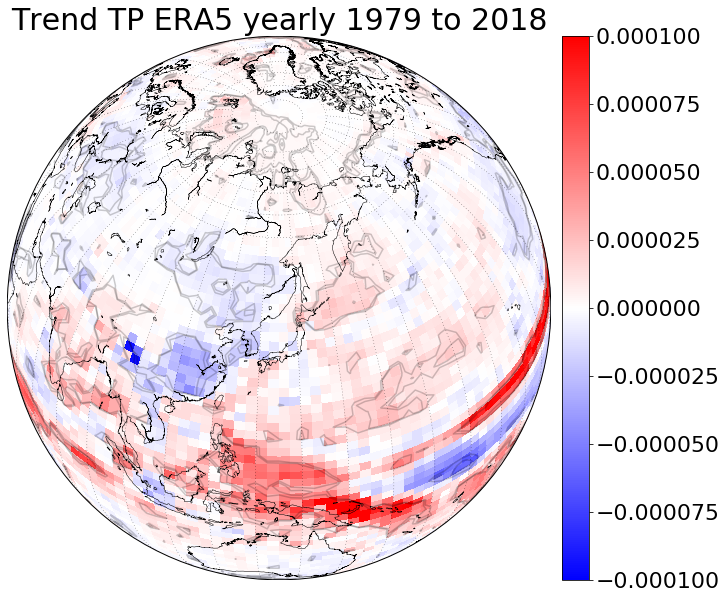

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

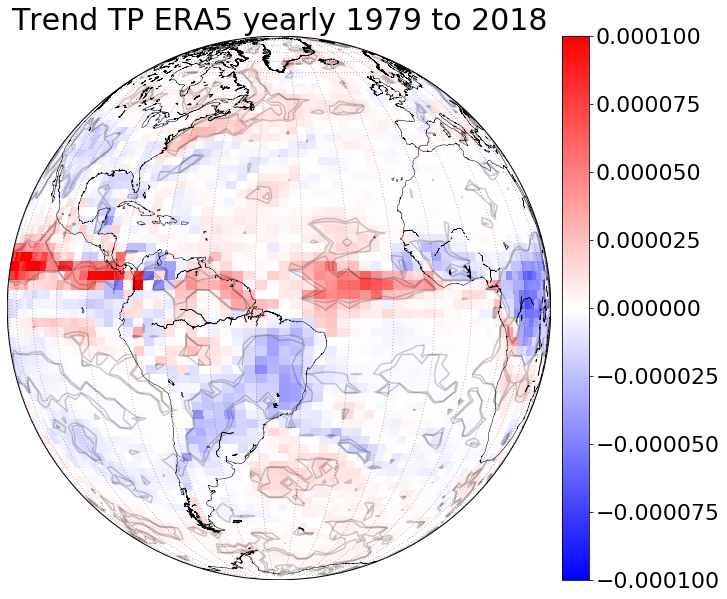

'Warning: Cannot label meridians on full-disk
Geostationary, Orthographic or Azimuthal equidistant basemap

<Figure size 432x288 with 0 Axes>

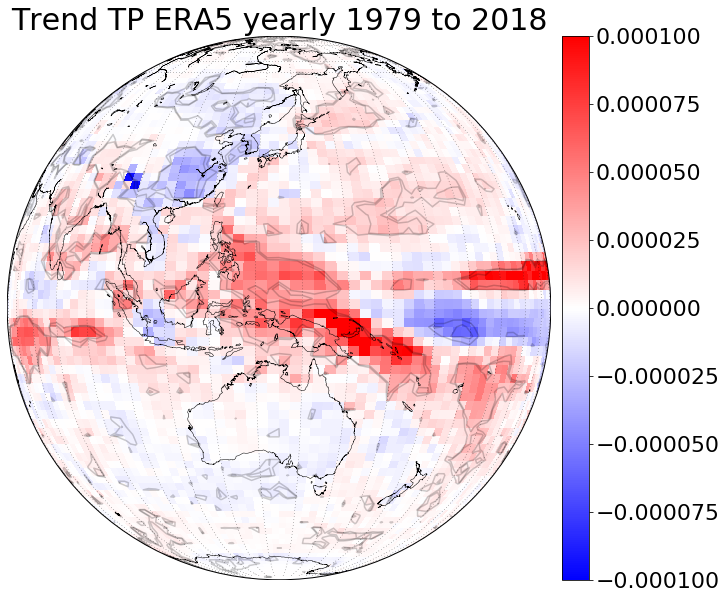

<Figure size 432x288 with 0 Axes>

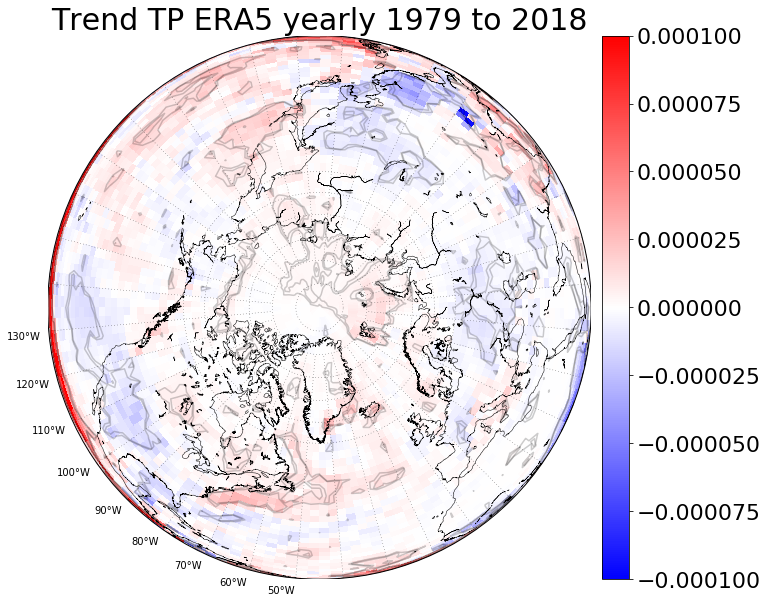

<Figure size 432x288 with 0 Axes>

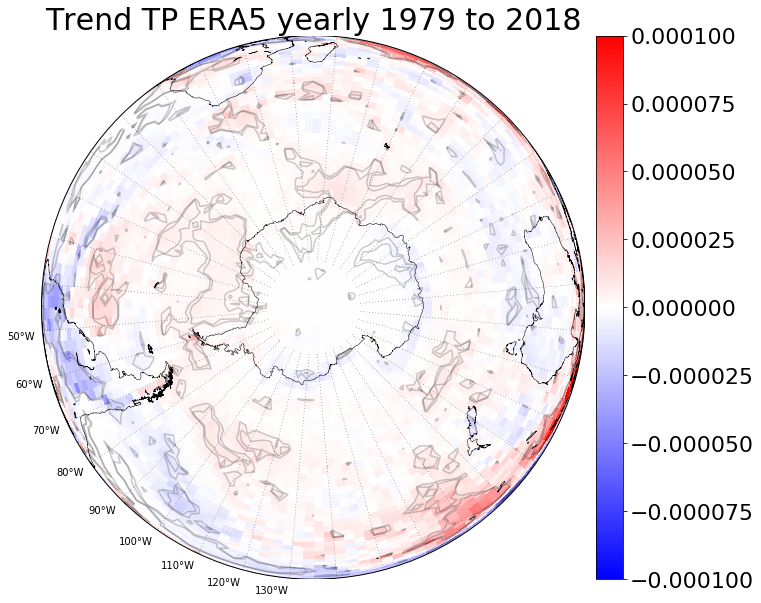

In [48]:


#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='moll',lon_0=-180,resolution='c')

#m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out_m = np.ma.masked_less(s2m_out, 90)

x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
#CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
CS=m.pcolor(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')
m.pcolor(x, y, s2m_out_m, hatch='x', alpha=0.1)



#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()

#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=45,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])  
s2m_out_m = np.ma.masked_less(s2m_out, 90)


x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
#CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap=my_cmap)
CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')
plt.pcolor(x, y, s2m_out_m, hatch='x', alpha=0.1)


#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()


#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=45,lon_0=135,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap=my_cmap)
CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')

#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()



#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=0,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap=my_cmap)
CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')

#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()

#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=0,lon_0=135,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap=my_cmap)
CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')

#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()


#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=90,lon_0=-45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
CS=m.pcolormesh(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')
#CS=m.pcolormesh(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap=my_cmap)
#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()

#Yearly average
plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=-90,lon_0=45,resolution='l')
#m = Basemap(width=3000000,height=2000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
#llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
#CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(TP_array[120+month:240:12],0)-np.mean(TP_array[0+month:120:12],0) #2000s-1990s
#diff=np.mean(TP_array[240+month:336:12],0)-np.mean(TP_array[120+month:240:12],0)
#lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
#TP_out,lat_out,~lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
TP_out,lat_out,lon_out=addcyclic(trend_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
s2m_out,lat_out,lon_out=addcyclic(sig_a_TP[::-1,:],lat[::-1,:],lon[::-1,:])    
x, y = m(lon_out, lat_out)
llevels = np.arange(90,100,5) # check etopo.ravel().max()
CS=m.contour(x, y, s2m_out, vmin=0, vmax=100,levels=llevels,colors='k', linestyles='-',alpha=0.2)
my_cmap=plt.cm.bwr
#my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolor(x, y, TP_out, vmin=-0.1, vmax=+0.1,cmap=my_cmap)
CS=m.pcolor(x, y, TP_out, vmin=-1e-4, vmax=+1e-4,cmap='bwr')

#CS=m.pcolormesh(x, y, s2m_out, vmin=0, vmax=100,cmap=my_cmap)
m.colorbar()
#plt.title('TP ERA-I '+ months[month]+' '+'2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/TP_ERAI_'+month_str+'_2000s-1990s.png', dpi=100)
plt.title('Trend TP ERA5 yearly 1979 to 2018', fontsize=30)
#plt.savefig('Figs_Maps/TP_ERAI/Trend_TP_ERAI_yearly_1990_to_2017_Turkey_sig.png', dpi=100)
plt.show()

# EOFs calculation 
###credit: WIlliam Gregory

In [48]:
! ls /Users/micheltsamados/Dropbox/WilliamGregory/ERA5_T2m.nc



CausalCode
ClimateNetworkProposal
Conferences
Docs
ERA5_T2m.nc
FiguresBathymetryReanalysis
Forecast.pdf
GPR_networks_p2.docx
Icon?
MCMC
Meetings
ModelCICE
ModelCICE2019
ModelCICE_Schroeder2014
ModelCICE_Schroeder2019
ModelCICE_Stroeve2019
PaperForecast1
PolarMonitoringExistingWork
Poster.pdf
Procedure20170404
Python
SnowTeleconnections_JulienneEmail_20171122
Turing Workshop SPONSORSHIP FORM FINAL JUNE DEADLINE 20170609.docx
Upgrade
Will DTP Proposal
WillG_UKSI.pptx
Will_AGU_poster.pdf
advert content.docx
cice_linkmaps
mechanisms.pptx
paper_images.pptx
~$WillG_UKSI.pptx


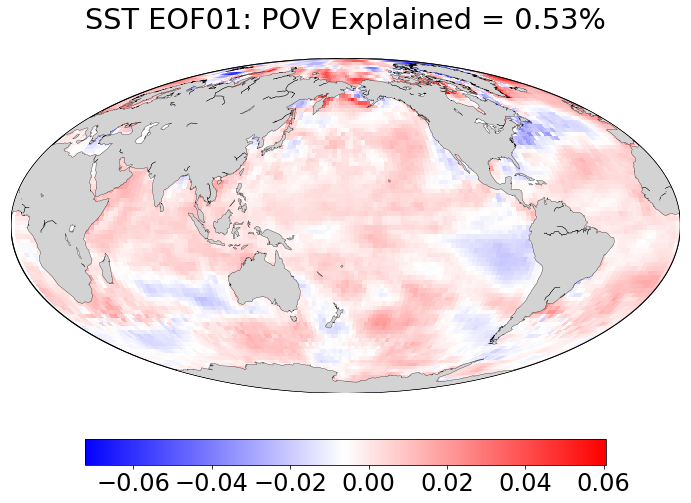

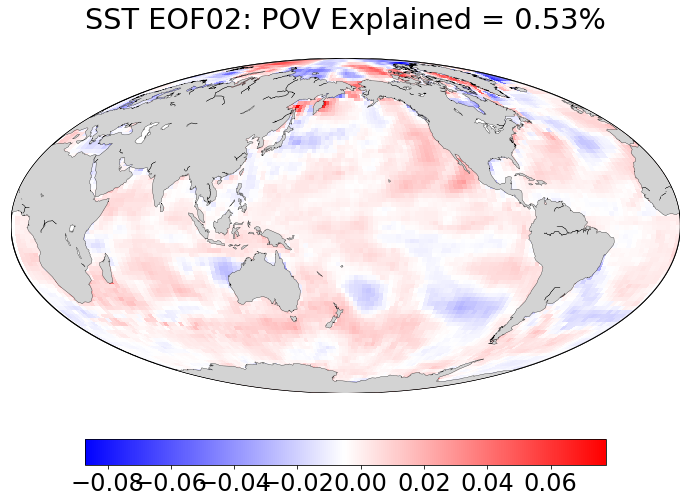

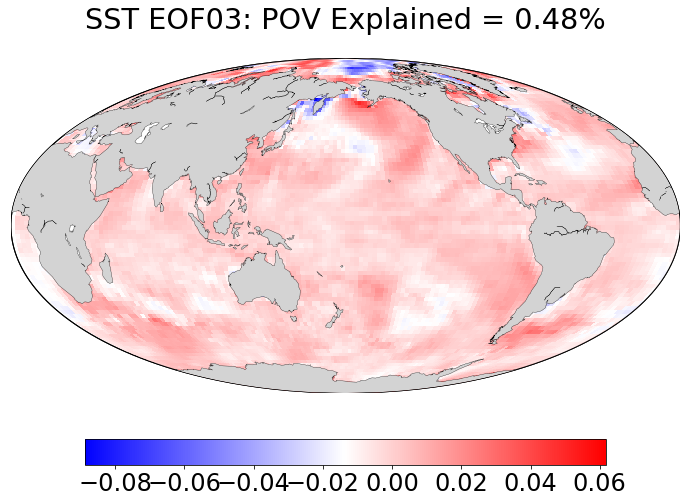

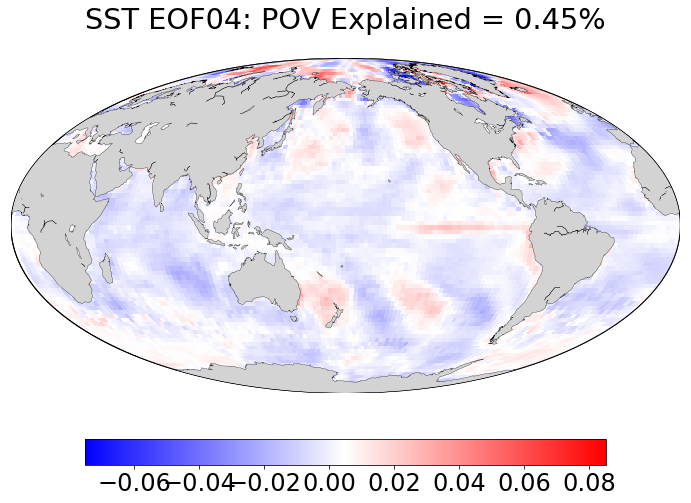

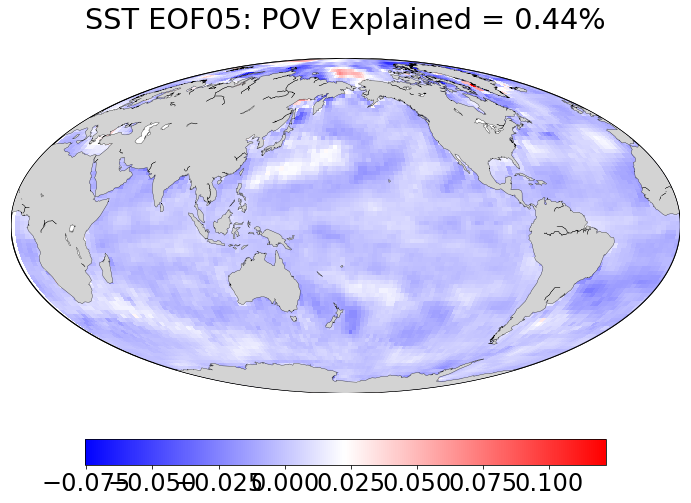

...

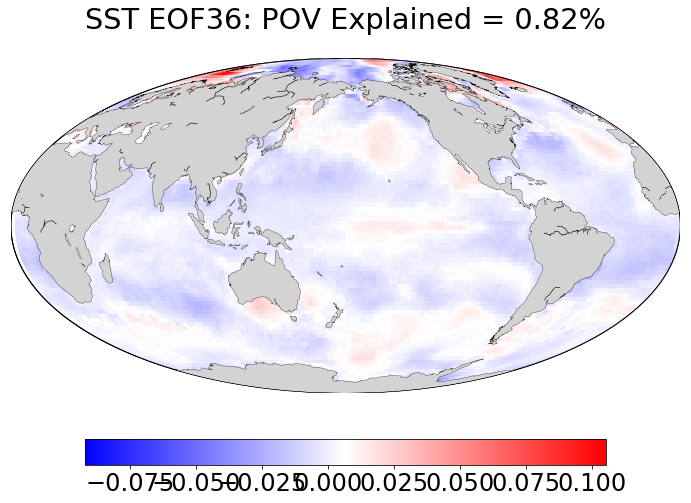

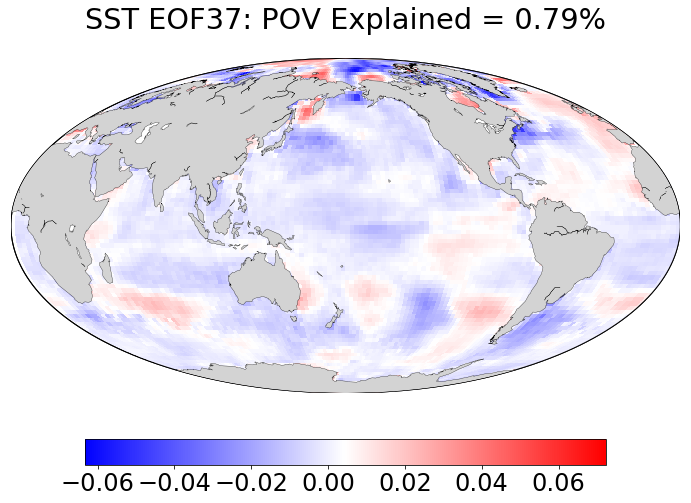

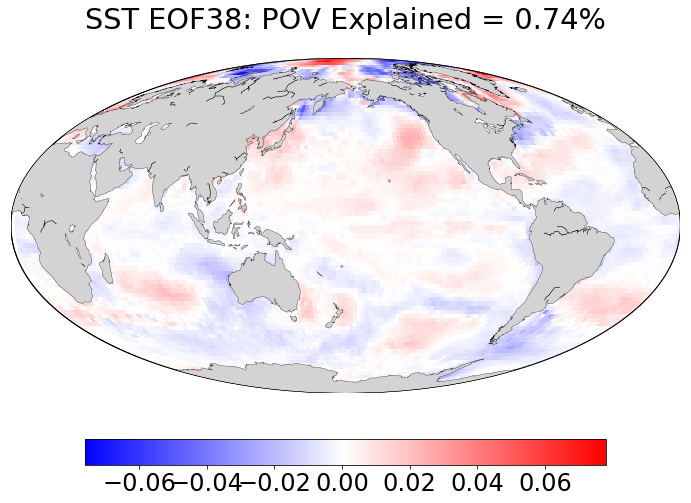

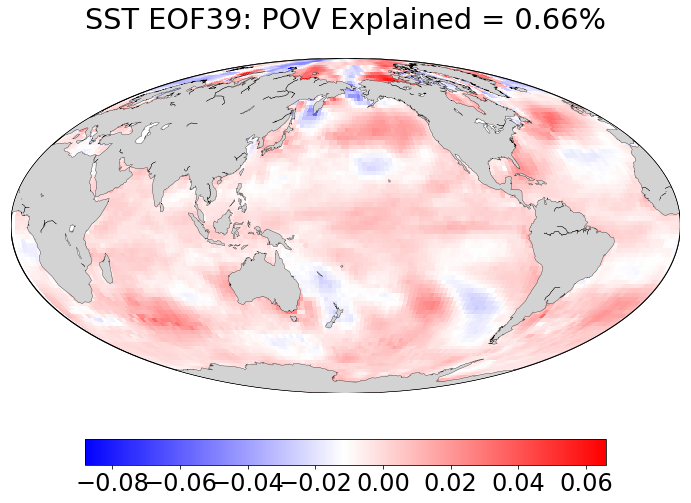

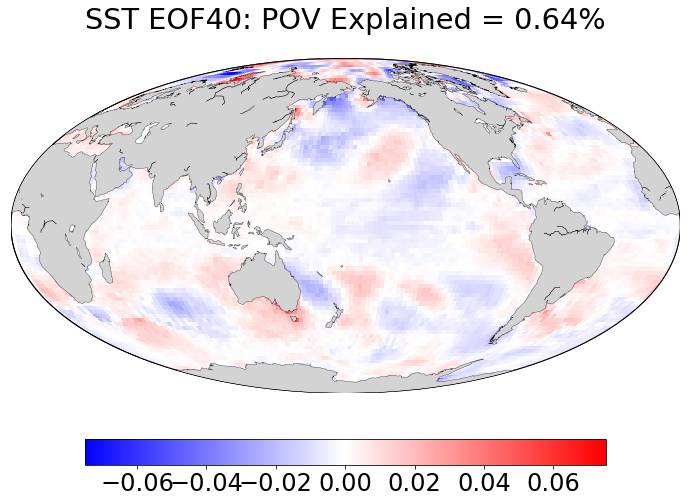

In [89]:
# def get_SST_data():
#     SST = {}
#     months = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
#     file = Dataset(‘./ERA5_SST_1x1.nc')
#     data = np.array(file['sst_0001']) - 273.15
#     data[data<0] = np.nan
#     data = data.transpose(1,2,0)
#     SST[‘all_months’] = data
#     for month in range(12):
#         monthly = np.zeros((dimX,dimY,(2019-1979+1)))
#         t = 0
#         for y in range(0,(2019-1979+1)*12,12):
#             monthly[:,:,t] = data[:,:,y+month]
#             t += 1
#         SST[months[month]] = monthly
#     return SST
 
import itertools    

def get_T2m_data():
    T2m = {}
    months = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
    file = Dataset('/Users/mct/Dropbox/WilliamGregory/ERA5_T2m.nc')
    data = np.array(file['t2m_0001'])
    data = data.transpose(1,2,0)
    T2m['all_months'] = data
    for month in range(12):
        monthly = np.zeros((dimX,dimY,(2019-1979+1)))
        t = 0
        for y in range(0,(2019-1979+1)*12,12):
            monthly[:,:,t] = data[:,:,y+month]
            t += 1
        T2m[months[month]] = monthly
    return T2m


def detrend(dataset,dX,dY):
    months = ['jan']
    for month in months:
        data = dataset[month]
        detrended = np.zeros(data.shape) ; detrended[detrended==0] = np.nan
        trend = np.zeros((dX,dY,2)) ; trend[trend==0] = np.nan
        for i,j in itertools.product(range(dX),range(dY)):
            if (~np.isnan(data[i,j,:]).all()) & (max(abs(data[i,j,:])) > 0):
                trendT, interceptT, r_valsT, probT, stderrT = stats.linregress(np.arange(data.shape[2]),data[i,j,:])
                lineT = (trendT*np.arange(data.shape[2])) + interceptT
                trend[i,j,0] = trendT
                trend[i,j,1] = interceptT
                detrended[i,j,:] = data[i,j,:]-lineT

        dataset[month+'_dt'] = detrended
        dataset[month+'_trend'] = trend
            
def EOF(dataset,month):
    data = np.copy(dataset[month+'_dt'])
    data_weighted = np.zeros(data.shape)
    weights = np.sqrt(np.cos(np.radians(lat[:,:])))
#    weights = np.sqrt(np.cos(np.radians(lat[:,:-1])))

    for year in range(1979,2019+1):
        t = year - 1979
        data_weighted[:,:,t] = np.multiply(data[:,:,t],weights[:,:])
    
    data_weighted[np.isnan(data_weighted)] = 0             
    X = data_weighted.ravel().reshape((dimX*dimY),2019-1979+1)
    C = np.dot(X.T,X)
    weights = weights.ravel().reshape(dimX*dimY,1)
    Lambda, PCs = scipy.linalg.eigh(C)
    sigma = np.sqrt(Lambda)
    I = np.eye(len(sigma))*sigma
    EOFs = (np.dot(X,PCs)/sigma)/weights
    total_var = sum(Lambda)
    
    t = 10
    for year in range(1979,2018+1): #this outputs EOF images in order of decreasing explained variance
#    for year in range(1979,2019+1): #this outputs EOF images in order of decreasing explained variance
        tag = (year - 1979) + 1
        t = t - 1
        EOF = EOFs[:,t].reshape(dimX,dimY)
        POV = (Lambda[t]/total_var)*100 #Percentage Of Variance Explained
        fig = plt.figure(figsize=(12,12))
        plt.rcParams.update({'font.size': 24})
        #bwr_50 = cmap_discretize('bwr',51)
        m.drawcoastlines(linewidth=0.3)
        m.fillcontinents(color='lightgrey',lake_color='white')
        m.drawmapboundary(fill_color='white')
        m.pcolor(x,y,EOF,cmap='bwr')
        #m.pcolor(x,y,EOF,cmap=bwr_50)
        cbar = plt.colorbar(orientation='horizontal', pad=0.07, fraction=0.04)
        cbar.solids.set_rasterized(True)
        cbar.solids.set_edgecolor("face")
        ttl = plt.title('SST EOF'+str("%02d"%tag)+': POV Explained = '+str("%.2f"%POV)+'%')
        ttl.set_position([.5,1.07])
        plt.show()

                   
lon = np.arange(0,360,2.5)
lat = np.arange(90,-92,-2)
dimX = len(lat)
dimY = len(lon)
lon,lat = np.meshgrid(lon,lat)
                   
#lon = np.arange(0,361,1)
#lat = np.arange(90,-91,-1)
#dimX = len(lat)
#dimY = len(lon)-1
#lon,lat = np.meshgrid(lon,lat)
#m = Basemap(projection='ortho',lon_0=240,lat_0=0,resolution='l')
#m = Basemap(projection='moll', llcrnrlat=-90, urcrnrlat=90,\
#            llcrnrlon=360, urcrnrlon=0, resolution='c', lon_0=180)
m = Basemap(projection='moll',lon_0=-180,resolution='c')
x,y = m(lon,lat)

T2m = get_T2m_data()
detrend(T2m,dimX,dimY)
EOF(T2m, 'jan')

In [54]:
data[:,:,t].shape

NameError: name 'data' is not defined

### SST from ERA-I

In [28]:
#Read values

#xvals = lon
#yvals = lat
moda = []
#moda = [[] for i in range(3)]
#mdfa = [[] for i in range(3)]
#Issues with grid_2 and grid_5
k=-1
for n in [1990,2000,2010]:
    #k=k+1
    i='%03d' % (n)
    print(i)
    #moda[n]=[]
    #mdfa[n]=[]
    moda.append(Dataset('ERA-i/era_interim_moda_'+i+'.nc',"r"))
#     moda[k].append(Dataset('ERA-i/era_interim_moda_'+i+'.nc',"r"))
#    moda[n].append(Dataset('ERA-i/era_interim_moda_'+i+'.nc',"r"))
    #mdfa[n].append(Dataset('ERA-i/era_interim_mdfa_'+i+'.nc',"r"))

1990
2000
2010


In [29]:
#Concatenate lists 1990 + 2000 + 2010s
moda[2]['sst'].shape
#subset_moda[1][0]['t2m'].shape
sst_array=np.concatenate(np.array((moda[0]['sst'],moda[1]['sst'],moda[2]['sst'])))
print(t2m_array.shape)
#Calculate t2m_season
#t2m_season=ma.masked_array((4,28,241,480))
sst_season=[]
for i in range(4):
    sst_season.append((sst_array[0+i*3:336:12]+sst_array[1+i*3:336:12]+sst_array[2+i*3:336:12])/3.)

(336, 241, 480)


'Warning: Cannot label meridians on full-disk
                Geostationary, Orthographic or Azimuthal equidistant basemap
                

NameError: name 'depth_ERAI_nn' is not defined

<Figure size 432x288 with 0 Axes>

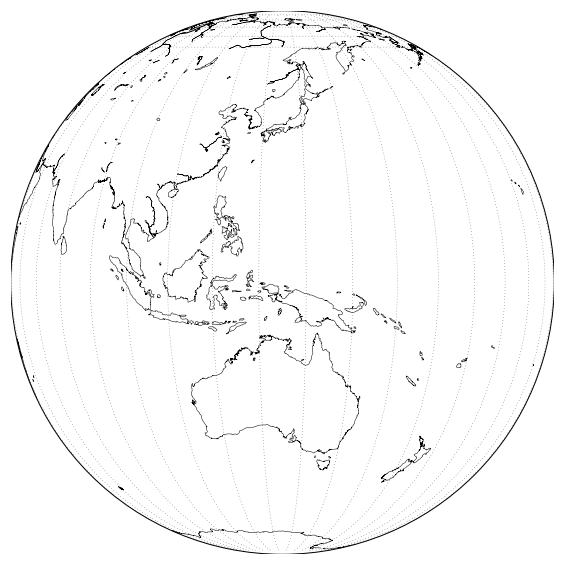

In [30]:
#Plot yearly average 
from matplotlib import cm, rcParams
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
months=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.clf()
plt.figure(figsize=(15,10))
m = Basemap(projection='ortho',lat_0=0,lon_0=135,resolution='l')
#m = Basemap(width=6000000,height=4000000,
#            rsphere=(6378137.00,6356752.3142),\
#            resolution='l',area_thresh=1000.,projection='lcc',\
#            lat_1=55.,lat_2=85,lat_0=80,lon_0=0.)
#t=12*(20-1)+7
m.drawcoastlines(linewidth = 0.5)
m.fillcontinents(color='grey',alpha=0.)#,lake_color='aqua')
m.drawparallels(np.arange(60,90,5),linewidth=0.5, fontsize=10, dashes=[1,5])
m.drawmeridians(np.arange(0,360,10),labels=[1,0,0,1],linewidth=0.5, fontsize=10, dashes=[1,5])
ax = plt.gca()
llevels = np.arange(-2000,0,250) # check etopo.ravel().max()
CS=m.contour(x, y, -depth_ERAI_nn, vmin=-8000, vmax=0,levels=llevels,colors='k', linestyles='-',alpha=0.1)
#diff=np.mean(sst_array[120:240:1],0)-np.mean(sst_array[0:120:1],0) #2000s - 1990s
diff=np.mean(sst_array[240:336:1],0)-np.mean(sst_array[120:240:1],0) #2010s - 2000s
#diff=np.mean(sst_array[240:336:1],0)-np.mean(sst_array[0:120:1],0) #2010s - 2000s

lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
sst_out,lat_out,lon_out=addcyclic(diff[::-1,:],lat[::-1,:],lon[::-1,:])
x, y = m(lon_out, lat_out)
my_cmap=plt.cm.bwr
my_cmap_r = reverse_colourmap(my_cmap)
#CS=m.pcolormesh(x, y, sst_out, vmin=-2, vmax=+2,cmap=my_cmap)
CS=m.contourf(x, y, sst_out, levels=[-2.25, -1.75, -1.25, -0.75, -0.25, 0.25, 0.75, 1.25, 1.75, 2.25], extend='both', vmin=-2.25, vmax=+2.25,cmap=my_cmap)
#CS=m.contourf(x, y, sst_out, levels=[-2.25, -1.75, -1.25, -0.75, -0.25, 0.25, 0.75, 1.25, 1.75, 2.25], extend='both', vmin=-2.25, vmax=+2.25,cmap=my_cmap)
m.colorbar()
plt.rcParams.update({'font.size': 22})
plt.title('SST ERA-I 2010s - 2000s', fontsize=30)
#plt.savefig('Figs_Maps/sst_ERAI/sst_ERAI_yearly_2010s-2000s_contour.png', dpi=100)
#plt.title('SST ERA-I 2000s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/sst_ERAI/sst_ERAI_yearly_2000s-1990s_contour.png', dpi=100)
#plt.title('SST ERA-I 2010s - 1990s', fontsize=30)
#plt.savefig('Figs_Maps/sst_ERAI/sst_ERAI_yearly_2010s-1990s_contour.png', dpi=100)
plt.show()

In [356]:
# Trend 2010 - 2017
num_months = 12 
num_years = 28 
nx = 241
ny = 480
var_sst = np.zeros((num_years, num_months, nx, ny))
for k in range(336):
    year=np.int(k/12.)
    m=np.int(k-year*12)
    #print(k,m,y+1990)
    var_sst[year,m]=sst_array[k]
    
    
start_year_sst = 1990
num_years_sst = 8
start_month = 0
start_year_trend = 2010 #1994#2004
num_years_trend = num_years_sst #10#7
iyearstart = start_year_trend - start_year_sst
trend_sst, trend_m_sst, sig_a_sst, sig_a_m_sst, r_a_sst, r_a_m_sst, int_a_sst, int_a_m_sst = cal_trend(iyearstart, num_years_trend, start_month, num_months, nx, ny, var_sst)
#trend_m_CICE_masked=ma.masked_where(var0_CICE_3D[0]>1e10, trend_m_CICE)
#trend_m_CICE_masked=ma.masked_where(var0_CICE_3D_m_masked<0.15, trend_m_CICE)

0
1
2
3
4
5
6
7
8
9
10
11


In [51]:
lon_out

masked_array(
  data=[[  0.  ,   0.75,   1.5 , ..., 358.5 , 359.25, 360.  ],
        [  0.  ,   0.75,   1.5 , ..., 358.5 , 359.25, 360.  ],
        [  0.  ,   0.75,   1.5 , ..., 358.5 , 359.25, 360.  ],
        ...,
        [  0.  ,   0.75,   1.5 , ..., 358.5 , 359.25, 360.  ],
        [  0.  ,   0.75,   1.5 , ..., 358.5 , 359.25, 360.  ],
        [  0.  ,   0.75,   1.5 , ..., 358.5 , 359.25, 360.  ]],
  mask=False,
  fill_value=1e+20,
  dtype=float32)

In [13]:
#Bug fix for addcyclic
#https://github.com/matplotlib/basemap/blob/master/lib/mpl_toolkits/basemap/__init__.py#L5102
def addcyclic(*arr,**kwargs):
    """
    Adds cyclic (wraparound) points in longitude to one or several arrays,
    the last array being longitudes in degrees. e.g.
   ``data1out, data2out, lonsout = addcyclic(data1,data2,lons)``
    ==============   ====================================================
    Keywords         Description
    ==============   ====================================================
    axis             the dimension representing longitude (default -1,
                     or right-most)
    cyclic           width of periodic domain (default 360)
    ==============   ====================================================
    """
    # get (default) keyword arguments
    axis = kwargs.get('axis',-1)
    cyclic = kwargs.get('cyclic',360)
    # define functions
    def _addcyclic(a):
        """addcyclic function for a single data array"""
        npsel = np.ma if np.ma.is_masked(a) else np
        slicer = [slice(None)] * np.ndim(a)
        try:
            slicer[axis] = slice(0, 1)
        except IndexError:
            raise ValueError('The specified axis does not correspond to an '
                    'array dimension.')
        return npsel.concatenate((a,a[slicer]),axis=axis)
    def _addcyclic_lon(a):
        """addcyclic function for a single longitude array"""
        # select the right numpy functions
        npsel = np.ma if np.ma.is_masked(a) else np
        # get cyclic longitudes
        clon = (np.take(a,[0],axis=axis)
                + cyclic * np.sign(np.diff(np.take(a,[0,-1],axis=axis),axis=axis)))
        # ensure the values do not exceed cyclic
        clonmod = npsel.where(clon<=cyclic,clon,np.mod(clon,cyclic))
        return npsel.concatenate((a,clonmod),axis=axis)
    # process array(s)
    if len(arr) == 1:
        return _addcyclic_lon(arr[-1])
    else:
        return list(map(_addcyclic,arr[:-1])) + [_addcyclic_lon(arr[-1])]

In [14]:
def reverse_colourmap(cmap, name = 'my_cmap_r'):
    """
    In: 
    cmap, name 
    Out:
    my_cmap_r

    Explanation:
    t[0] goes from 0 to 1
    row i:   x  y0  y1 -> t[0] t[1] t[2]
                   /
                  /
    row i+1: x  y0  y1 -> t[n] t[1] t[2]

    so the inverse should do the same:
    row i+1: x  y1  y0 -> 1-t[0] t[2] t[1]
                   /
                  /
    row i:   x  y1  y0 -> 1-t[n] t[2] t[1]
    """        
    reverse = []
    k = []   

    for key in cmap._segmentdata:    
        k.append(key)
        channel = cmap._segmentdata[key]
        data = []

        for t in channel:                    
            data.append((1-t[0],t[2],t[1]))            
        reverse.append(sorted(data))    

    LinearL = dict(zip(k,reverse))
    my_cmap_r = mpl.colors.LinearSegmentedColormap(name, LinearL) 
    return my_cmap_r

In [37]:
##############################################################################################
# Function to calculate the spatial mean of one field and write the trends in .dat files
# returns
#          ---> trend_time[year]
#          ---> trend_space[x,y]
##############################################################################################

def cal_trend(start_year, num_years, start_month, num_months, nx, ny, var):

# Initialize
        x = nx
        y = ny

##################
# Maps of trends
##################

# Monthly averaged
        num_years
        years = np.arange(num_years)
        trend_ym = np.zeros((num_months, x, y))
        sig_a_ym = np.zeros((num_months, x, y))
        r_a_ym = np.zeros((num_months, x, y))
        int_a_ym = np.zeros((num_months, x, y))

        for month in range(num_months):
                print (month)
                var_y = np.mean(var,1)
                for i in range(x):
                        for j in range(y):
                                slope, intercept, r, prob, stderr = stats.linregress(years,var[start_year:start_year+num_years, month, i, j])
                                trend_ym[month, i, j] = slope
                                sig_a_ym[month, i, j] = 100*(1-prob)
                                r_a_ym[month, i, j] = r
                                int_a_ym[month, i, j] = intercept

# Yearly averaged
        years = np.arange(num_years)
        trend = np.zeros((x, y))
        sig_a = np.zeros((x, y))
        r_a = np.zeros((x, y))
        int_a = np.zeros((x, y))

        for i in range(x):
                for j in range(y):
                        slope, intercept, r, prob, stderr = stats.linregress(years,var_y[start_year:start_year+num_years, i, j])
                        trend[i, j] = slope
                        sig_a[i, j] = 100*(1-prob)
                        r_a[i, j] = r
                        int_a[i, j] = intercept

        return trend, trend_ym, sig_a, sig_a_ym, r_a, r_a_ym, int_a, int_a_ym



In [25]:
! pwd

/Users/micheltsamados/Dropbox/FerhatYilmaz


In [ ]:
#Interpolate on ERA-I grid
#mapC = Basemap(projection='stere', lon_0=-45, lat_0=90, lat_ts=70, 
#        urcrnrlat=31.37 , urcrnrlon=102.34, llcrnrlat=33.92,  llcrnrlon=279.26)
m = Basemap(width=4000000,height=2000000,
            rsphere=(6378137.00,6356752.3142),\
            resolution='l',area_thresh=1000.,projection='lcc',\
            lat_1=30.,lat_2=40,lat_0=35,lon_0=39.)
t=0
lon, lat = np.meshgrid(moda[0]['longitude'],moda[0]['latitude'])
t2m_out,lat_out,lon_out=addcyclic(t2m_array[t][::-1,:],lat[::-1,:],lon[::-1,:])
x, y = m(lon_out, lat_out)
#depth_ERAI_nn=griddata((xtest.ravel(), ytest.ravel()),depth.ravel(), (x, y), method='nearest')